# GUC Clustering Project 

**Objective:** 
The objective of this project teach students how to apply clustering to real data sets

The projects aims to teach student: 
* Which clustering approach to use
* Compare between Kmeans, Hierarchal, DBScan, and Gaussian Mixtures  
* How to tune the parameters of each data approach
* What is the effect of different distance functions (optional) 
* How to evaluate clustering approachs 
* How to display the output
* What is the effect of normalizing the data 

Students in this project will use ready-made functions from Sklearn, plotnine, numpy and pandas 
 



In [2]:
# if plotnine is not installed in Jupter then use the following command to install it 


Running this project require the following imports 

In [3]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *   
# StandardScaler is a function to normalize the data 
# You may also check MinMaxScaler and MaxAbsScaler 
#from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
from sklearn.datasets import load_iris
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import MinMaxScaler
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

from sklearn.metrics import silhouette_score
import numpy as np
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN



%matplotlib inline

In [4]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

## Multi Blob Data Set 
* The Data Set generated below has 6 cluster with varying number of users and varing densities
* Cluster the data set below using 



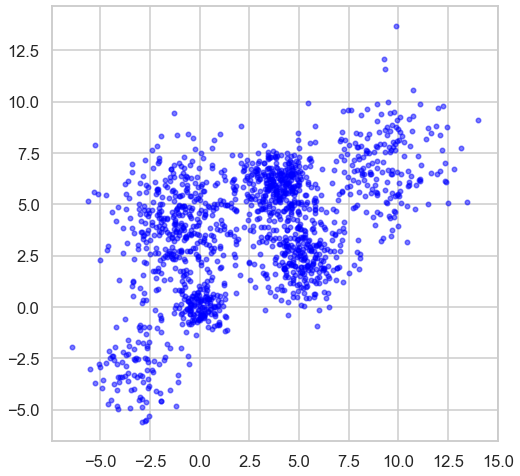

In [5]:
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6  
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data)

### Kmeans 
* Use Kmeans with different values of K to cluster the above data 
* Display the outcome of each value of K 
* Plot distortion function versus K and choose the approriate value of k 
* Plot the silhouette_score versus K and use it to choose the best K 
* Store the silhouette_score for the best K for later comparison with other clustering techniques. 

In [6]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

def kmeans_clustering(data, K_range):
    # Initialize lists to store distortion and silhouette scores for each value of K
    distortions = []
    silhouette_scores = []

    # Perform KMeans clustering for each value of K
    for k in K_range:
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(data)

        # Calculate distortion and silhouette score
        distortions.append(kmeans.inertia_)
        silhouette_scores.append(silhouette_score(data, kmeans.labels_))

        # Plot the clusters for each value of K
        plt.figure(figsize=[8,8])
        sns.scatterplot(x=data[:, 0], y=data[:, 1], hue=kmeans.labels_, palette='bright', legend=False)
        sns.scatterplot(x=kmeans.cluster_centers_[:, 0], y=kmeans.cluster_centers_[:, 1], s=100, color='black', marker='+')
        plt.title(f'KMeans Clustering (K={k})')
        plt.show()

    # Plot distortion function versus K
    plt.plot(K_range, distortions, 'bx-')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Distortion')
    plt.title('Elbow Method for Optimal K')
    plt.show()

    # Plot silhouette score versus K
    plt.plot(K_range, silhouette_scores, 'bx-')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Method for Optimal K')
    plt.show()

    # Choose the best K based on silhouette score
    best_K = np.argmax(silhouette_scores) + 2
    print(f'Best K based on silhouette score: {best_K}')

    # Store the silhouette score for the best K
    best_silhouette_score = silhouette_scores[best_K - 2]
    print(f'Silhouette score for the best K: {best_silhouette_score}')
    
    # Return the best KMeans model
    return KMeans(n_clusters=best_K, random_state=42)






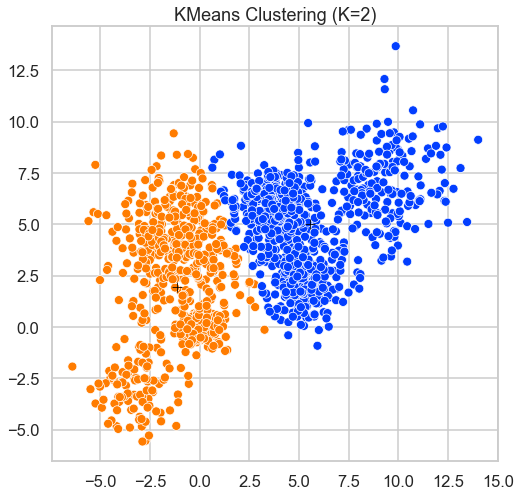

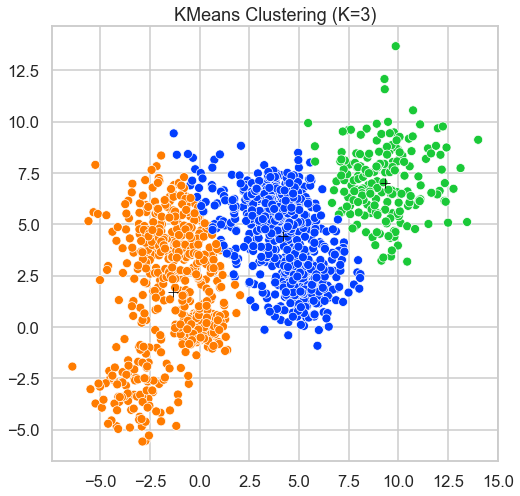

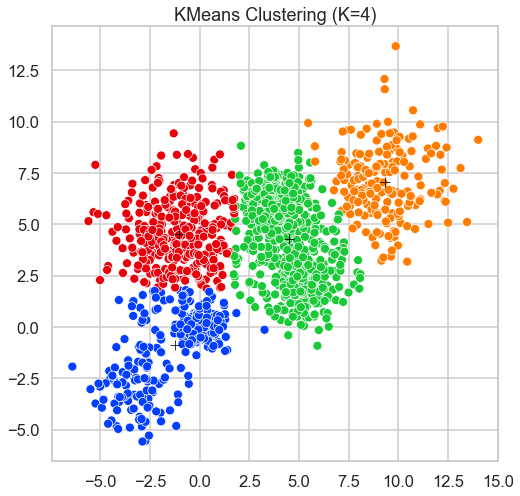

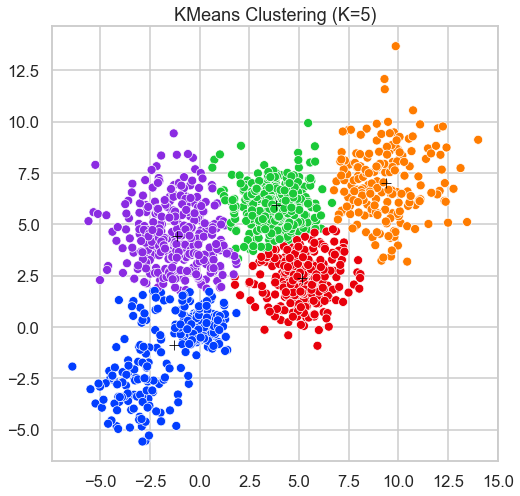

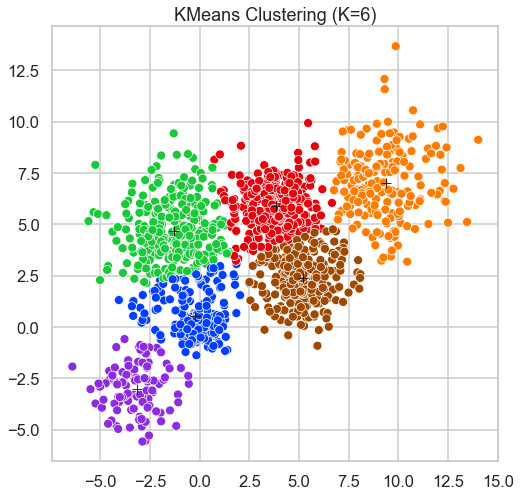

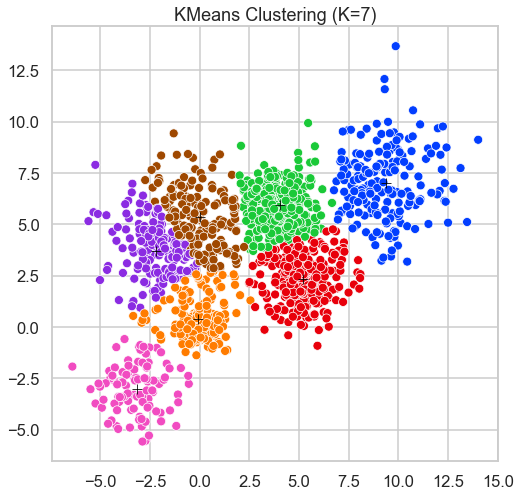

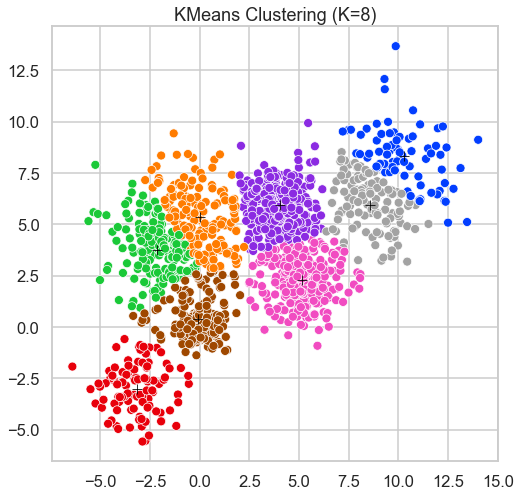

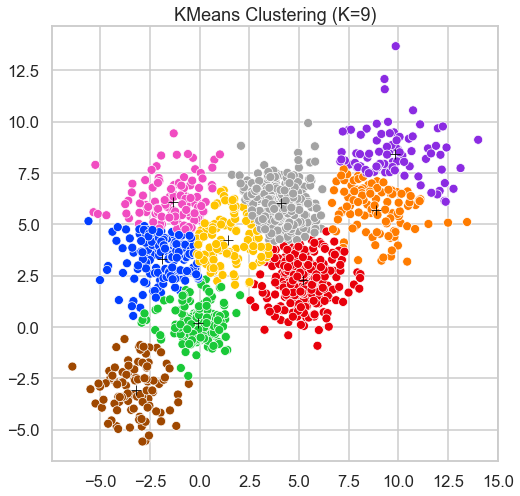

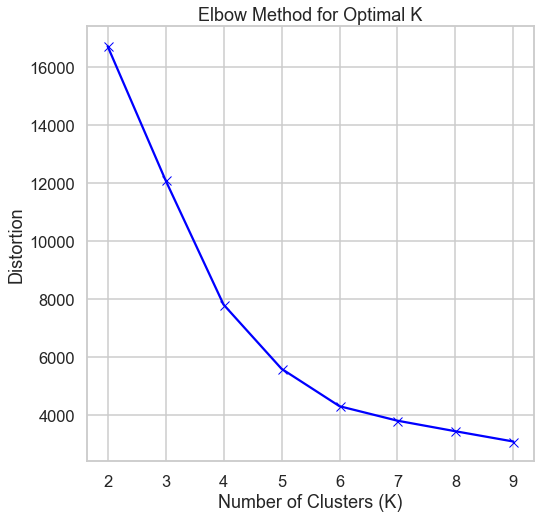

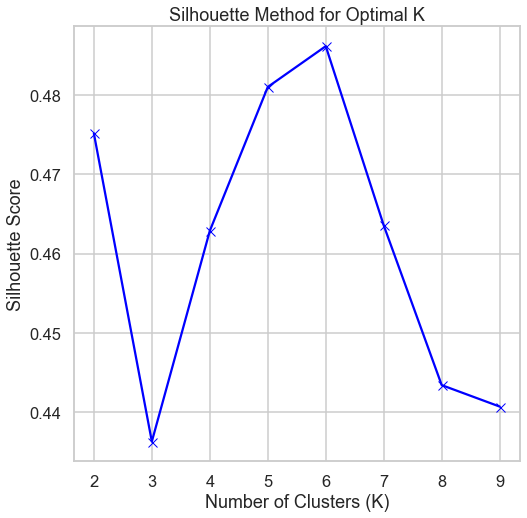

Best K based on silhouette score: 6
Silhouette score for the best K: 0.48614459735646176


In [7]:
# Perform KMeans clustering on Multi_blob_Data using a range of K values
K_range = range(2, 10)
kmeans_model = kmeans_clustering(Multi_blob_Data, K_range)

### Hierarchal Clustering
* Use AgglomerativeClustering function to  to cluster the above data 
* In the  AgglomerativeClustering change the following parameters 
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage( use average and single )
    * Distance_threshold (try different)
* For each of these trials plot the Dendograph , calculate the silhouette_score and display the resulting clusters  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observation 



In [8]:

def agglomerative_clustering(X):
    # Define the parameters to be tested
    affinities = ['euclidean', 'cosine']
    linkage_methods = ['average', 'single']
    distance_thresholds = [1, 1.5, 2, 2.5, 3, 3.5]

    # Store the best silhouette score and its corresponding parameters
    bestsilhouettescore = -1
    best_params = {}


    # Loop through all combinations of parameters
    for affinity in affinities:
        for linkage_method in linkage_methods:
            # Plot the dendrogram
            linkage_matrix = linkage(X,  method=linkage_method, metric=affinity)
            plt.figure(figsize=(12, 6))
            dendrogram(linkage_matrix,show_contracted=True)
            plt.title(f"{linkage_method.capitalize()} linkage , Used {affinity} distance")
            plt.xlabel('Data point')
            plt.ylabel('Distance')
            plt.show()
            for distance in distance_thresholds: 
                # Create AgglomerativeClustering object with current parameters
                AgglomerativeClustering1 = AgglomerativeClustering(linkage=linkage_method, affinity=affinity,n_clusters = None,compute_full_tree=True,distance_threshold=distance)
                # Fit the model to the data
                AgglomerativeClustering1.fit(X)
                plt.title(f"{linkage_method.capitalize()} linkage with {affinity} distance With Distance_Threshold= {distance}")
                plt.scatter(X[:, 0], X[:, 1], c=AgglomerativeClustering1.labels_, cmap='viridis')
                plt.show()
                # Print the labels assigned to each point by the clustering algorithm
                if len(np.unique(AgglomerativeClustering1.labels_)) > 1:
                    score = silhouette_score(X, AgglomerativeClustering1.labels_)
                    if score > bestsilhouettescore:
                        bestsilhouettescore = score
                        best_params = {'affinity': affinity, 'linkage': linkage_method, 'distance_threshold': distance}
    
    print("Set of paramters that would find result in the best silhouette score")
    print(best_params)
    
     
           

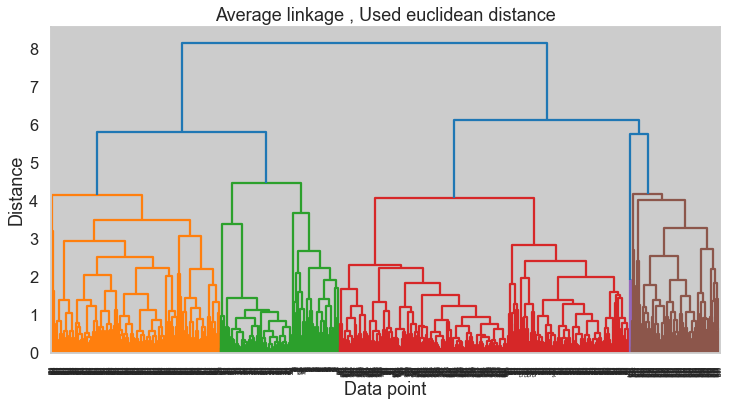

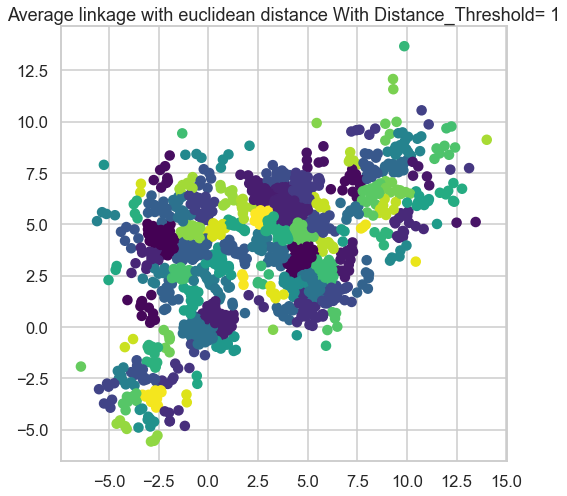

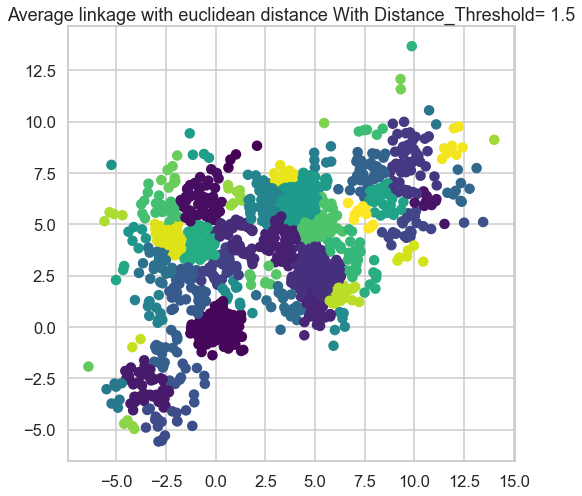

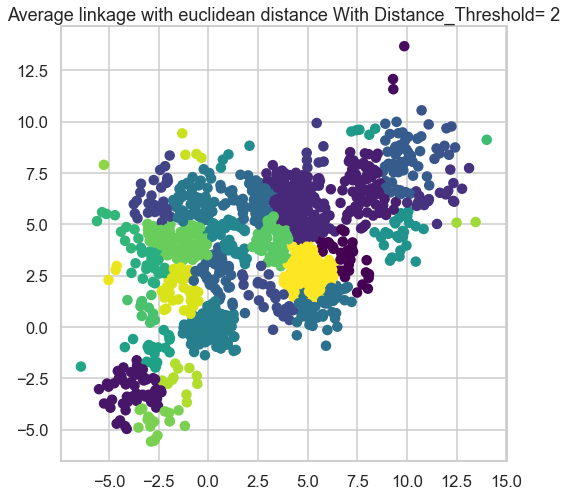

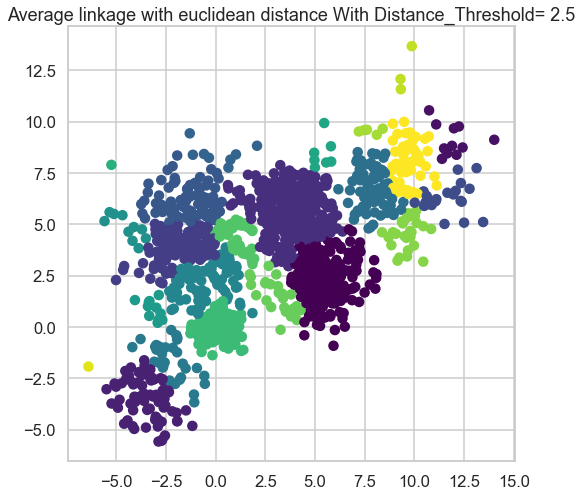

...

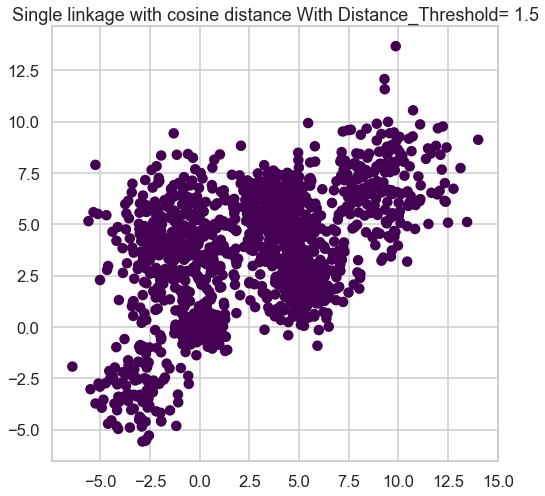

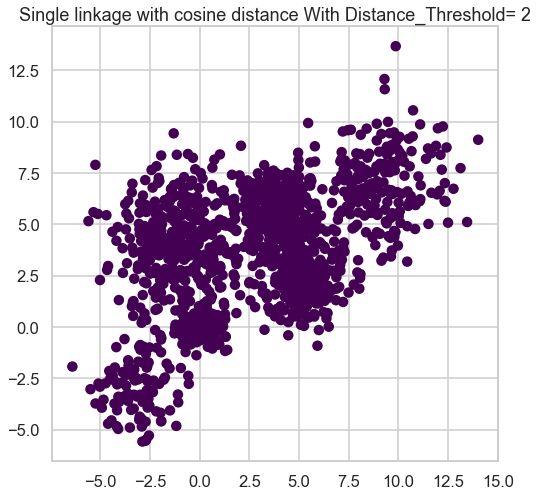

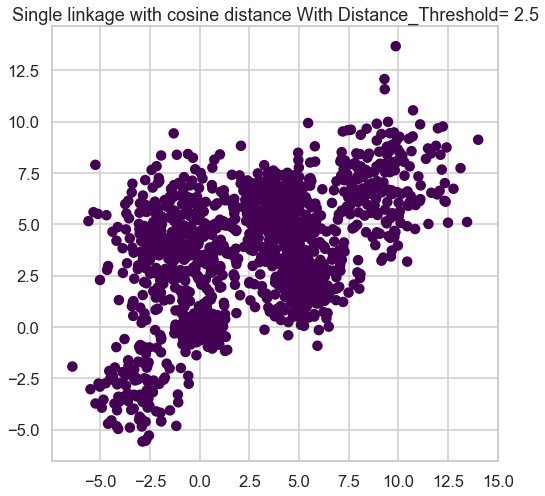

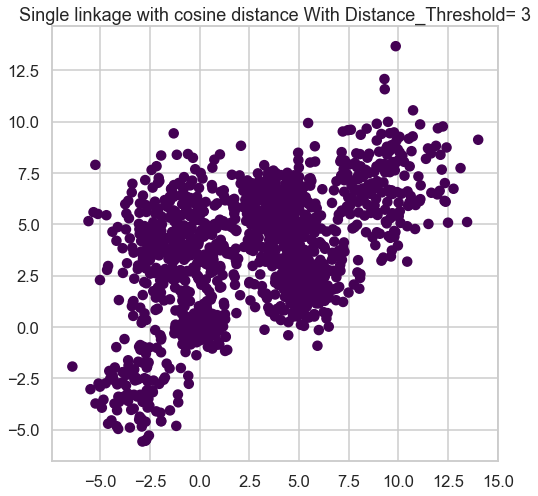

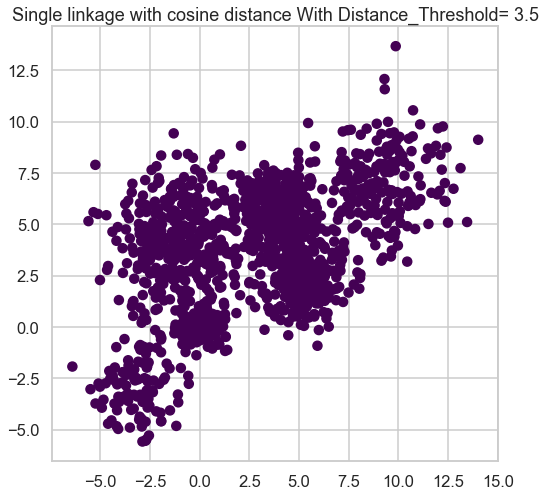

Set of paramters that would find result in the best silhouette score
{'affinity': 'euclidean', 'linkage': 'average', 'distance_threshold': 3.5}


In [9]:
agglomerative_clustering(Multi_blob_Data)


### DBScan
* Use DBScan function to  to cluster the above data 
* In the  DBscan change the following parameters 
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
* Plot the silhouette_score versus the variation in the EPS and the min_samples
* Plot the resulting Clusters in this case 
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observations and comments 




In [10]:
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

def dbscan_cluster(X):
    eps_range = np.arange(1.5, 3, 0.1)
    min_samples_range = np.arange(5, 25, 1)
    best_score = -1
    best_eps = None
    best_min_samples = None
    all_scores = []

    for eps in eps_range:
        for min_samples in min_samples_range:
            dbscan = DBSCAN(eps=eps, min_samples=min_samples)
            labels = dbscan.fit_predict(X)
            if len(np.unique(labels)) > 1:
                score = silhouette_score(X, labels)
            else:
                score = -1
            all_scores.append([eps, min_samples, score])
            if score > best_score:
                best_score = score
                best_eps = eps
                best_min_samples = min_samples

    all_scores = np.array(all_scores).reshape((len(eps_range), len(min_samples_range), 3))
    sns.heatmap(all_scores[:, :, 2], cmap="viridis", xticklabels=min_samples_range, yticklabels=eps_range)
    plt.xlabel("Min Samples")
    plt.ylabel("Eps")
    plt.title("Silhouette Score vs Variation in Parameters")
    plt.show()

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
    labels = dbscan.fit_predict(X)
    fig = px.scatter(x=X[:, 0], y=X[:, 1], color=labels)
    fig.update_layout(
        xaxis_title="Feature 1",
        yaxis_title="Feature 2",
        title="DBSCAN Clustering with Best Parameters",
        coloraxis_showscale=False
    )
    fig.show()

    print(f"Best parameters: eps = {best_eps:.2f}, min_samples = {best_min_samples}, silhouette score = {best_score:.3f}")


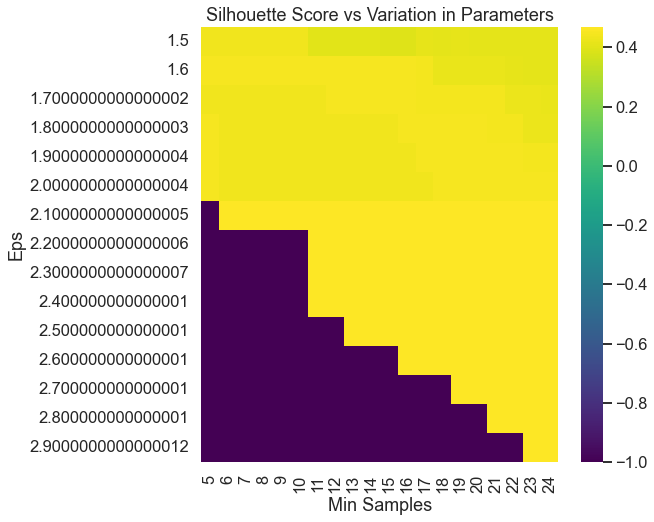

Best parameters: eps = 2.10, min_samples = 6, silhouette score = 0.469


In [11]:
dbscan_cluster(Multi_blob_Data)

### Gaussian Mixture
* Use GaussianMixture function to cluster the above data 
* In GMM change the covariance_type and check the difference in the resulting proabability fit 
* Use a 2D contour plot to plot the resulting distribution (the components of the GMM) as well as the total Gaussian mixture 

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score

def plot_gaussian_cluster(x):
    # Initialize the GMM model
    gmm = GaussianMixture(n_components=3, covariance_type='full')

    # Fit the model to the data
    gmm.fit(x)

    # Calculate the probability fit for each data point
    probs = gmm.predict_proba(x)

    # Generate a grid of points to evaluate the density at
    x_min, x_max = x[:, 0].min() - 1, x[:, 0].max() + 1
    y_min, y_max = x[:, 1].min() - 1, x[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
    grid = np.c_[xx.ravel(), yy.ravel()]

    # Evaluate the density at each point on the grid
    Z = -gmm.score_samples(grid)
    Z = Z.reshape(xx.shape)

    # Calculate the silhouette score
    labels = gmm.predict(x)
    score = silhouette_score(x, labels)

    # Plot the density contours and data points
    plt.contourf(xx, yy, Z, cmap=plt.cm.Purples_r)
    plt.scatter(x[:, 0], x[:, 1], s=10, color='black')
    plt.title(f"GMM with 3 components and full covariance")
    plt.xlabel("Feature 1")
    plt.ylabel("Feature 2")
    plt.show()

    print(f"Silhouette Score = {score}")

    # Plot the data using a diagonal covariance matrix
    gmm = GaussianMixture(n_components=3, covariance_type='diag')
    gmm.fit(x)
    labels = gmm.predict(x)
    score = silhouette_score(x, labels)
    plt.contourf(xx, yy, Z, cmap=plt.cm.Greens_r)
    plt.scatter(x[:, 0], x[:, 1], s=10, color='blue')
    plt.title(f"GMM with 3 components and diagonal covariance")
    plt.xlabel("Feature 1")
    plt.ylabel("Feature 2")
    plt.show()
    print(f"Silhouette Score = {score}")

    # Plot the data using a spherical covariance matrix
    gmm = GaussianMixture(n_components=3, covariance_type='spherical')
    gmm.fit(x)
    labels = gmm.predict(x)
    score = silhouette_score(x, labels)
    plt.contourf(xx, yy, Z, cmap=plt.cm.Oranges_r)
    plt.scatter(x[:, 0], x[:, 1], s=10, color='red')
    plt.title(f"GMM with 3 components and spherical covariance")
    plt.xlabel("Feature 1")
    plt.ylabel("Feature 2")
    plt.show()
    print(f"Silhouette Score = {score}")


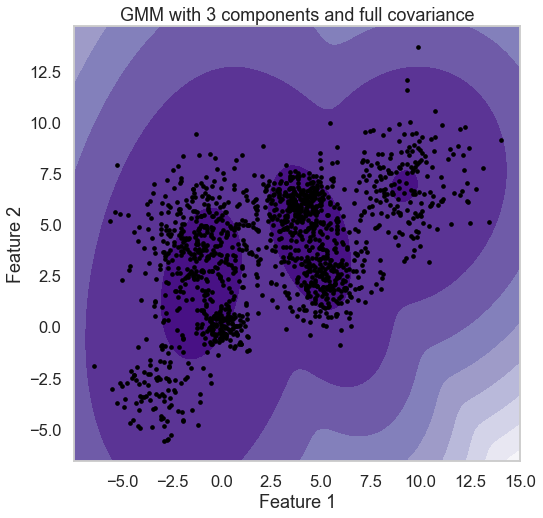

Silhouette Score = 0.4269852585476477


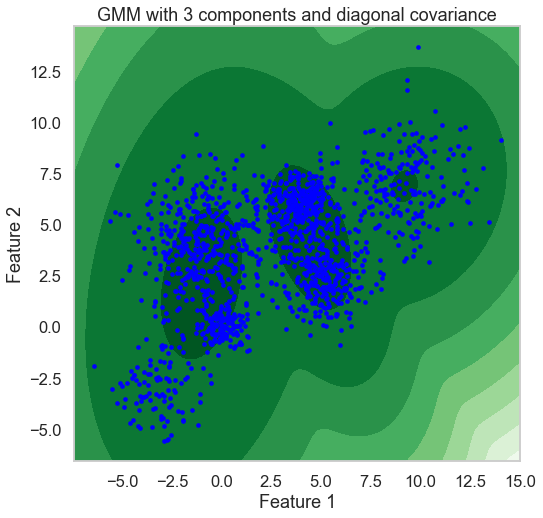

Silhouette Score = 0.4380395351075611


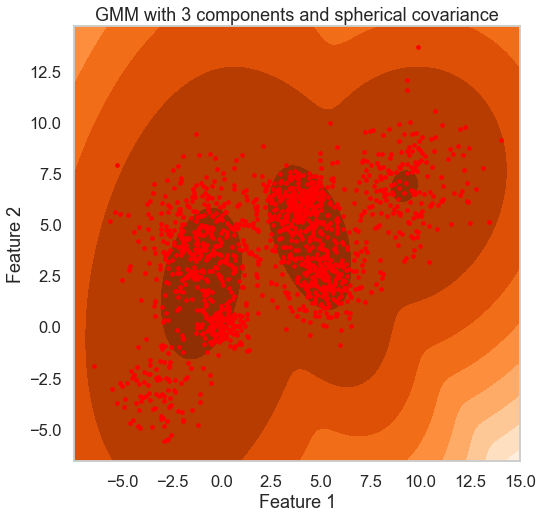

Silhouette Score = 0.436934584282156


In [13]:
plot_gaussian_cluster(Multi_blob_Data)

## iris data set 
The iris data set is test data set that is part of the Sklearn module 
which contains 150 records each with 4 features. All the features are represented by real numbers 

The data represents three classes 


In [33]:
from sklearn.datasets import load_iris
iris_data = load_iris()
iris_data.target[[10, 25, 50]]
#array([0, 0, 1])
list(iris_data.target_names)
['setosa', 'versicolor', 'virginica']


['setosa', 'versicolor', 'virginica']

* Repeat all the above clustering approaches and steps on the above data 
* Normalize the data then repeat all the above steps 
* Compare between the different clustering approaches 

# Normalization


In [34]:
iris = load_iris()
iris_data = iris.data
scaler = MinMaxScaler()
iris_normalized = scaler.fit_transform(iris_data)


# Kmeans Clustering

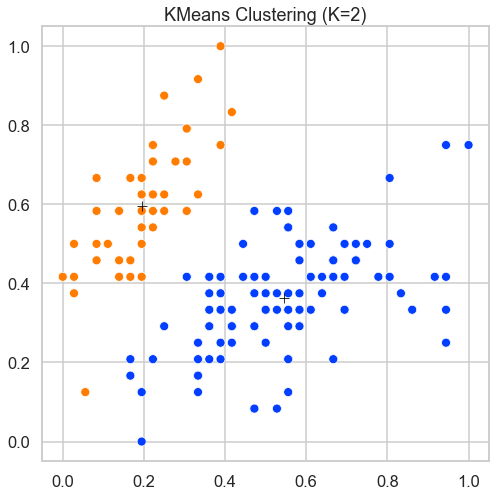

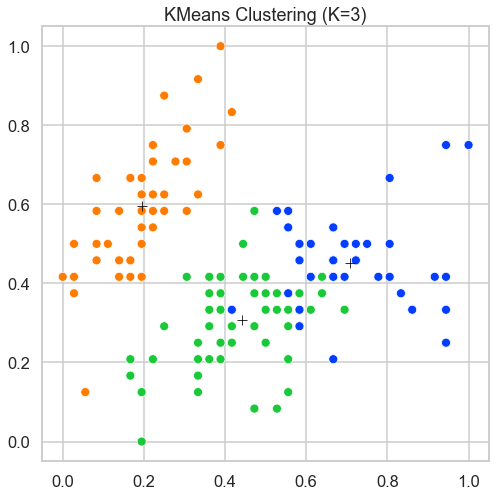

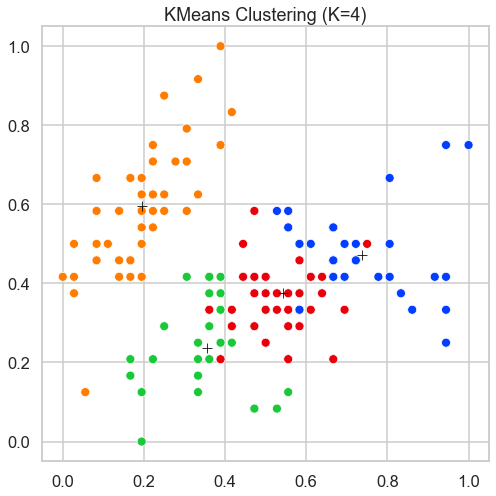

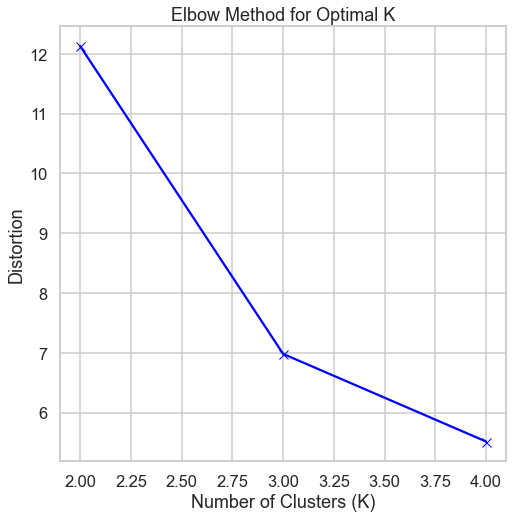

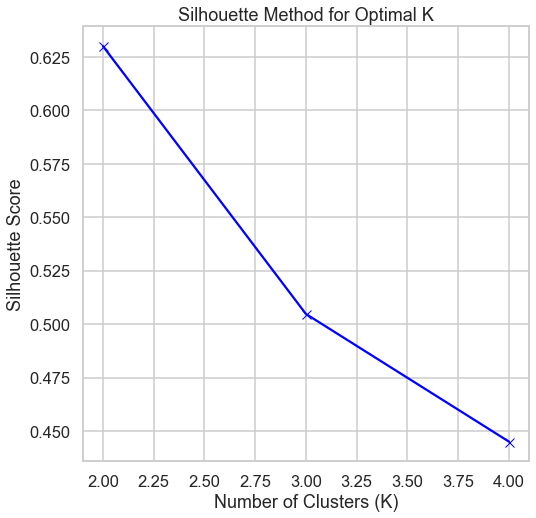

Best K based on silhouette score: 2
Silhouette score for the best K: 0.6300471284354711


In [35]:
K_range = range(2, 5)
kmeans_model = kmeans_clustering(iris_normalized, K_range)

# Hierarchal Clustering

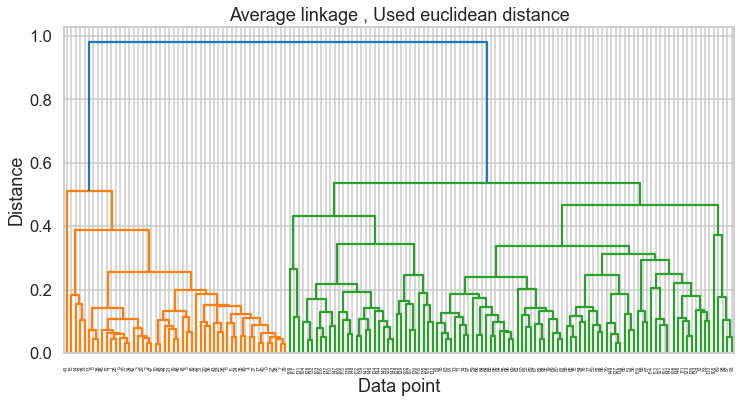

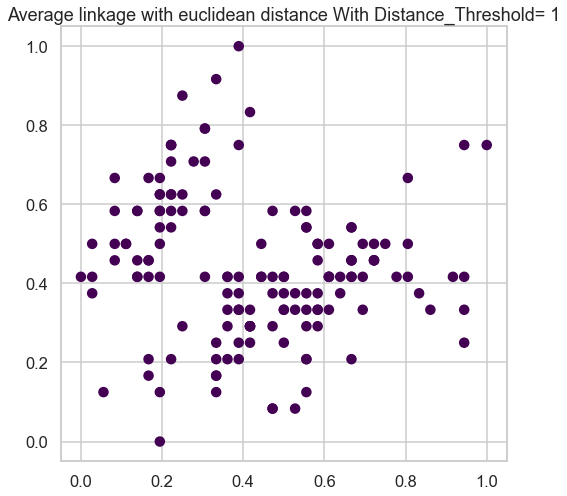

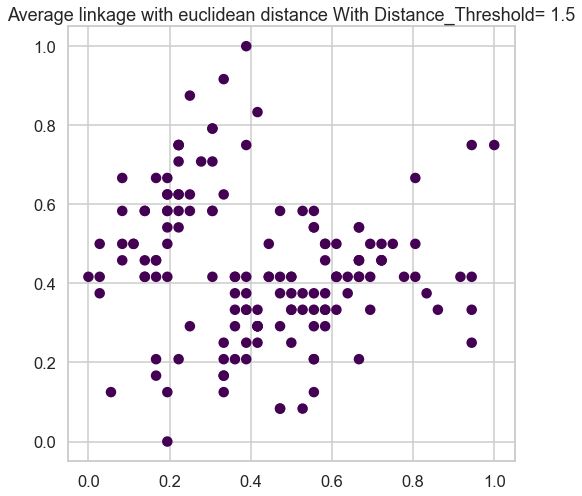

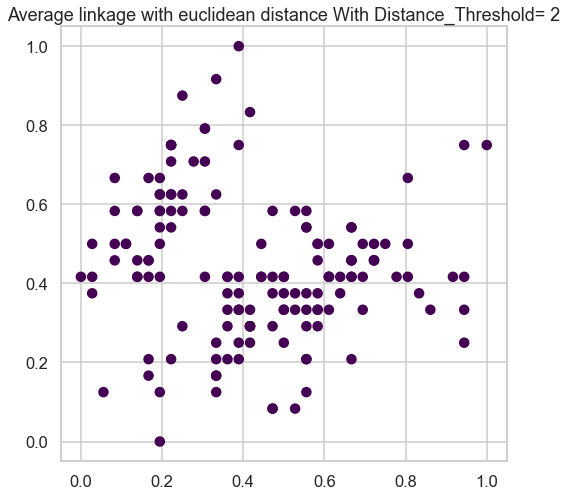

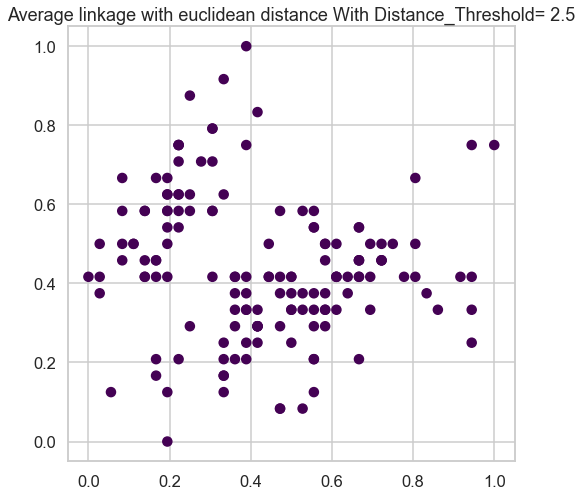

...

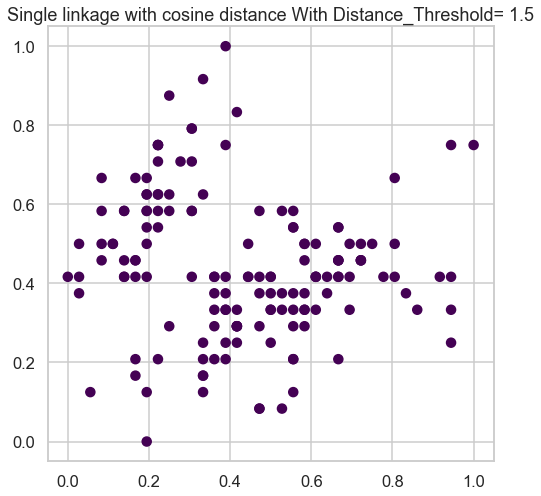

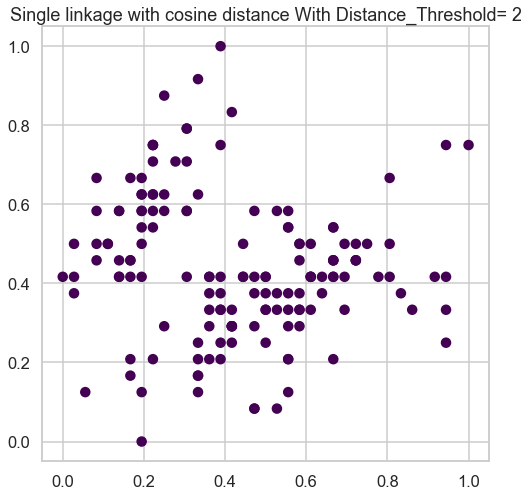

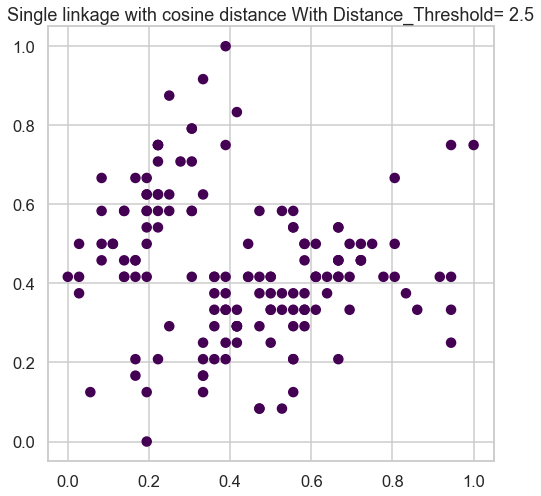

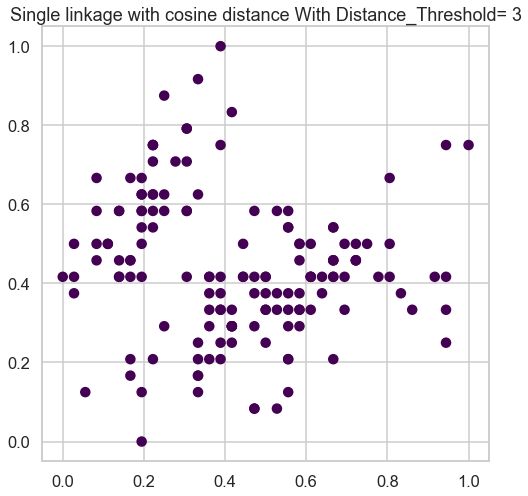

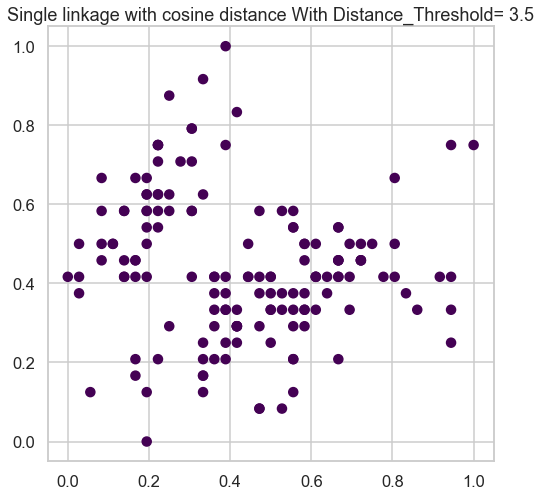

Set of paramters that would find result in the best silhouette score
{}


In [36]:
agglomerative_clustering(iris_normalized)


# DBScan

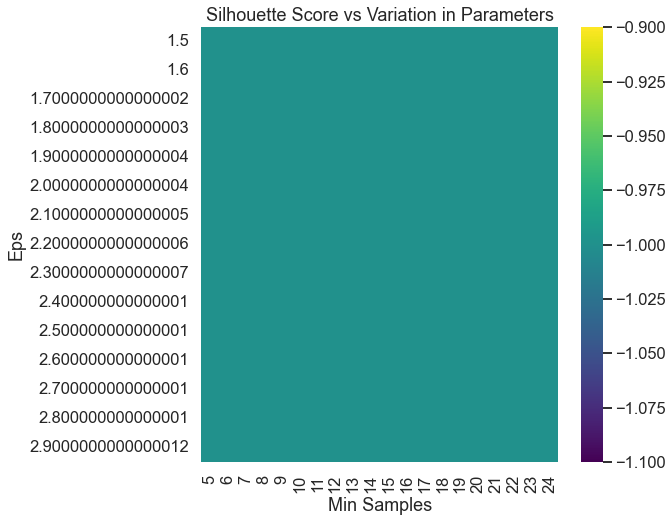

TypeError: '>' not supported between instances of 'NoneType' and 'float'

In [23]:
dbscan_cluster(iris_normalized)

# Gaussian Mixture

In [37]:
plot_gaussian_cluster(iris_normalized)

ValueError: X has 2 features, but GaussianMixture is expecting 4 features as input.

## Customer dataset
Repeat all the above on the customer data set 

In [41]:
Customer = pd.read_csv(r"C:\Users\sheha\OneDrive\Desktop\Machine Learing Project\Customer data.csv")
Customer_d=Customer[['Age','Income',"Settlement size"]]
scaler = MinMaxScaler()
Customer_d_normalized = scaler.fit_transform(Customer_d)

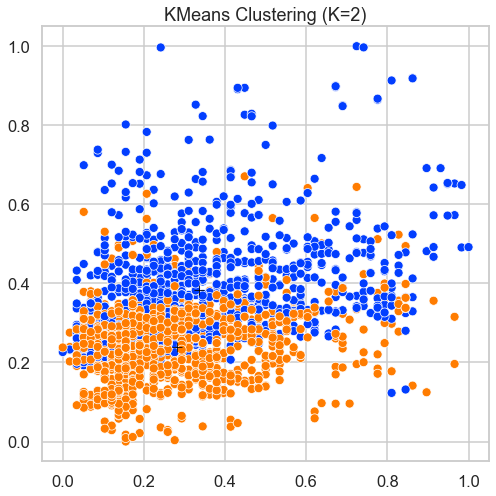

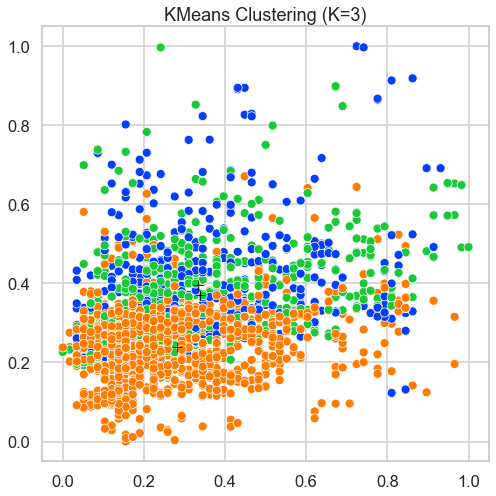

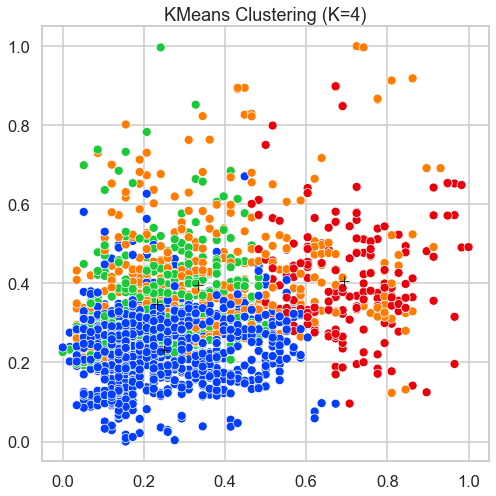

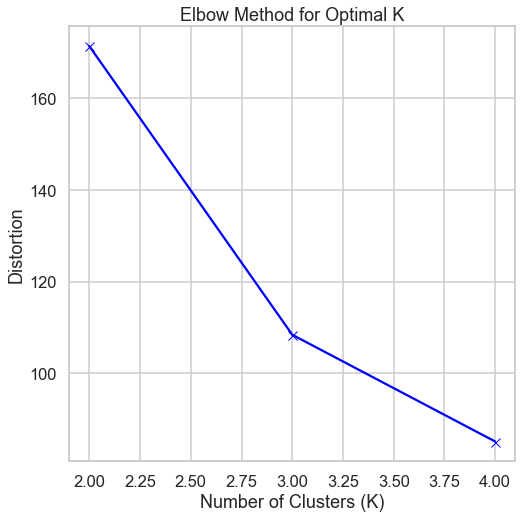

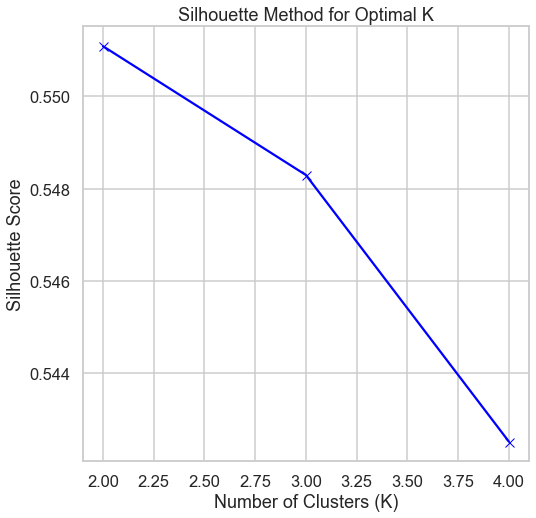

Best K based on silhouette score: 2
Silhouette score for the best K: 0.5510893078051174


In [42]:
K_range = range(2, 5)
kmeans_model = kmeans_clustering(Customer_d_normalized, K_range)

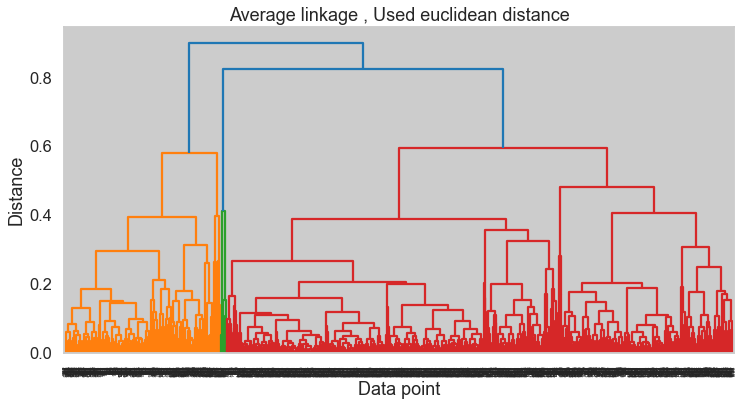

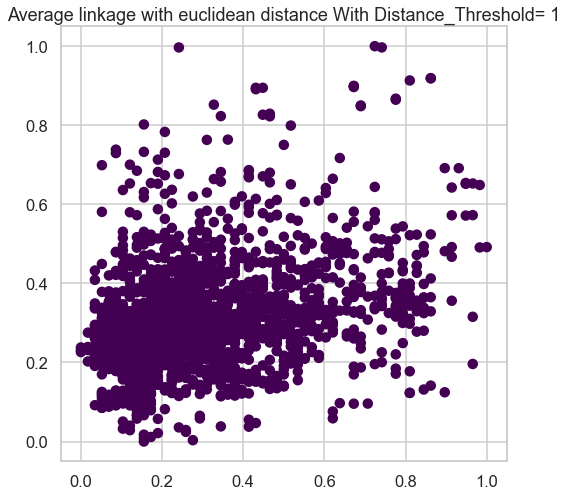

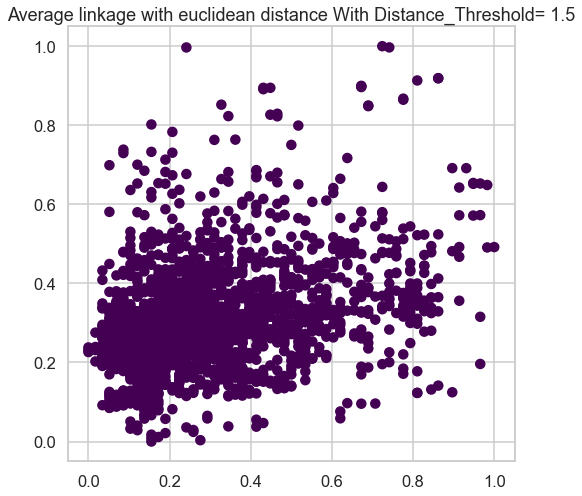

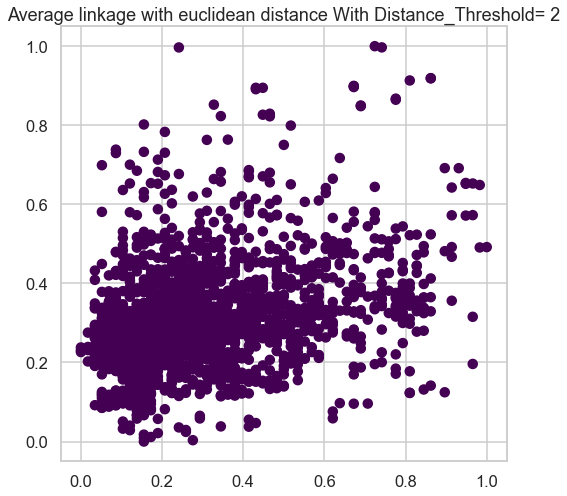

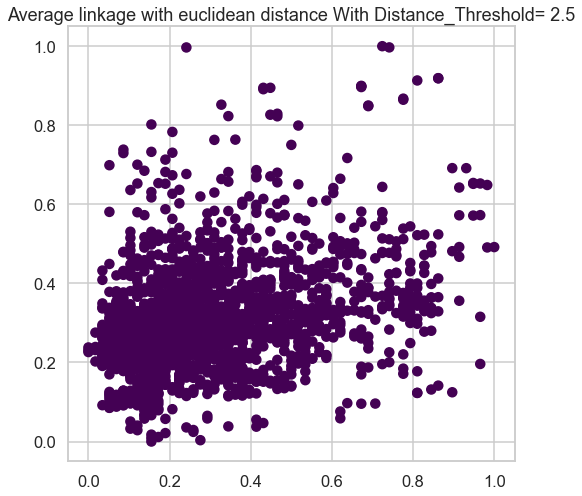

...

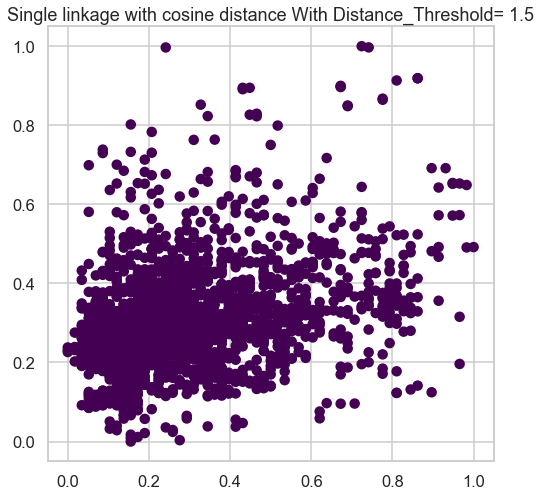

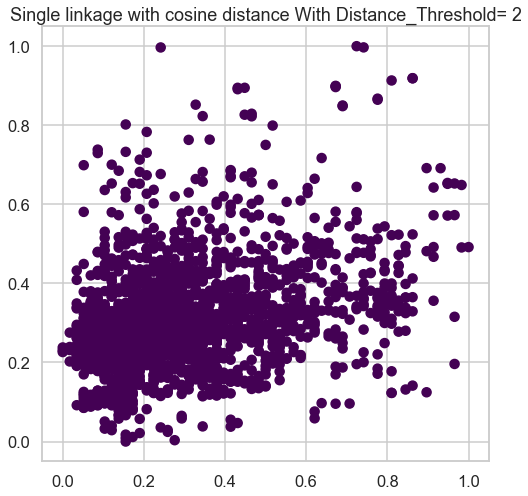

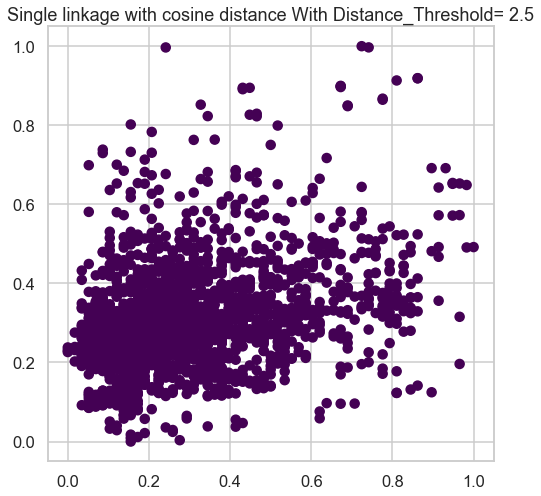

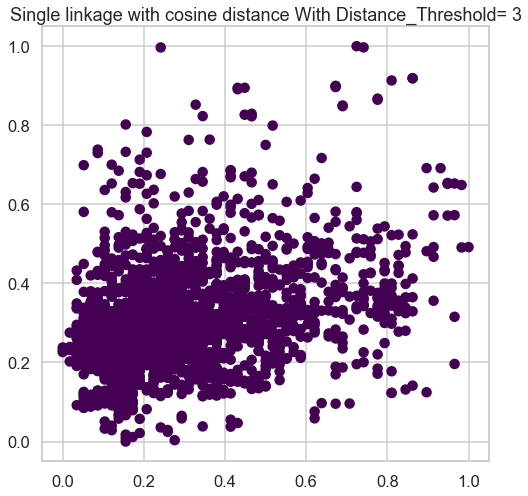

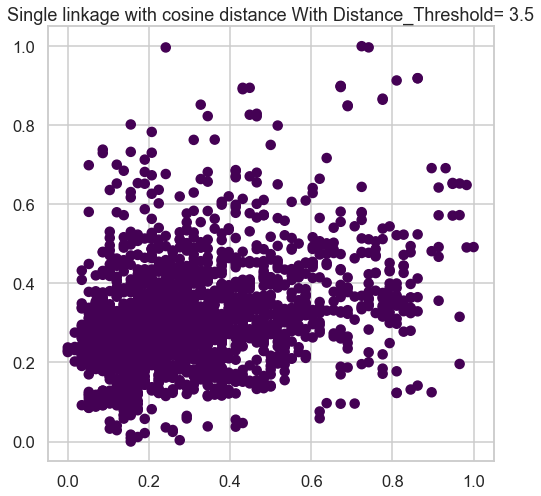

Set of paramters that would find result in the best silhouette score
{}


In [43]:
agglomerative_clustering(Customer_d_normalized)


In [44]:
plot_gaussian_cluster(Customer_d_normalized)

ValueError: X has 2 features, but GaussianMixture is expecting 3 features as input.

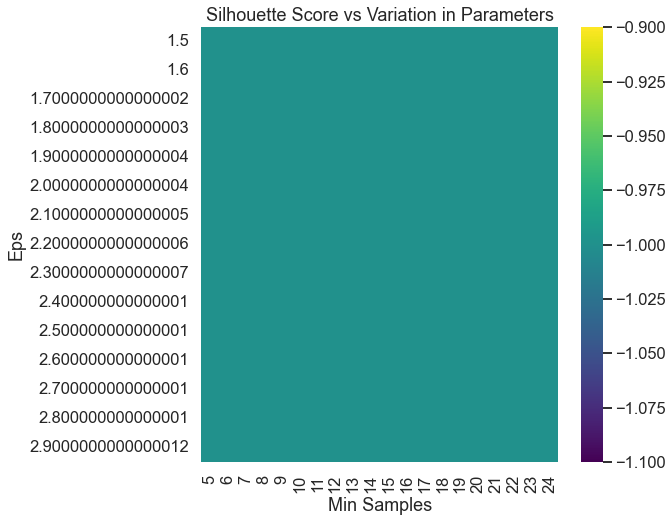

TypeError: '>' not supported between instances of 'NoneType' and 'float'

In [45]:
dbscan_cluster(Customer_d_normalized)